## Load Audio File to Jupiter

In [5]:
from scipy.io import wavfile
rate, x = wavfile.read('pirates-of-the-caribean.wav')

# the audio has two channels, by doing x[:,0] we select the first one

aud = x[:,0]

[ 0  0  0 ... -2  2 -2]


## Plot signal in Time and Frequency Domain

Text(0.5, 1.0, 'Spectrogram')

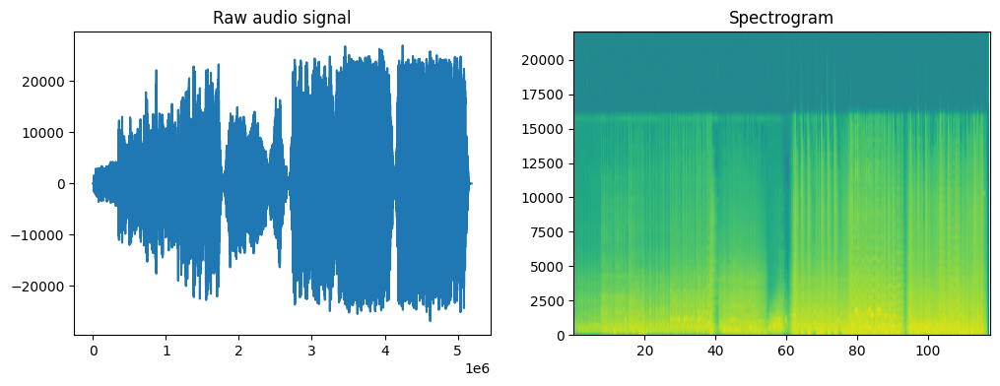

In [8]:
%matplotlib inline
from matplotlib import pyplot as plt
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(aud); ax1.set_title('Raw audio signal')
ax2.specgram(aud, Fs=rate); ax2.set_title('Spectrogram')

# WITH THIS CODE YOU CAN LIMIT THE SPECTOGRAM´S PLOT'S RANGE

# plt.ylim(000,7000)
# plt.xlim(30,45)

## Filter used in the audio

If the gain of the frequency response is 1, the output signal is equal to the input signal. It is said if the power is lower than a half in dBS the signal is considered erased.

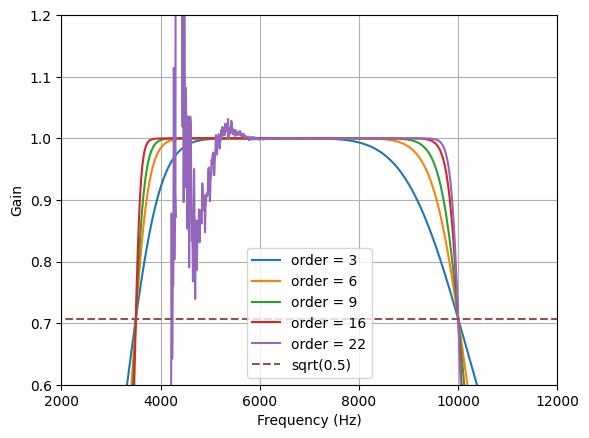

In [16]:
from scipy.signal import butter, lfilter

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y


def run():
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import freqz

    # Sample rate and desired cutoff frequencies (in Hz).
    fs = rate
    lowcut=3500
    highcut=10000

    # Plot the FREQUENCY RESPONSE for a few different orders.
    # the order of the filter changes the sharpness of the filter's edges, but be carfeful because if it is too high (n=22) it saturates .

    plt.figure(1)
    plt.clf()
    for order in [3, 6, 9, 16, 22]:
        b, a = butter_bandpass(lowcut, highcut, fs, order=order)
        w, h = freqz(b, a, worN=2000)
        plt.plot((fs * 0.5 / np.pi) * w, abs(h), label="order = %d" % order)

    plt.plot([0, 0.5 * fs], [np.sqrt(0.5), np.sqrt(0.5)],
             '--', label='sqrt(0.5)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Gain')
    plt.grid(True)
    plt.legend(loc='best')
    
    plt.xlim(2000,12000)
    plt.ylim(0.6,1.2)
    
    plt.show()


run()

## Filter the audio and plot the result in Time and Frequency Domain

Text(0.5, 1.0, 'Spectrogram')

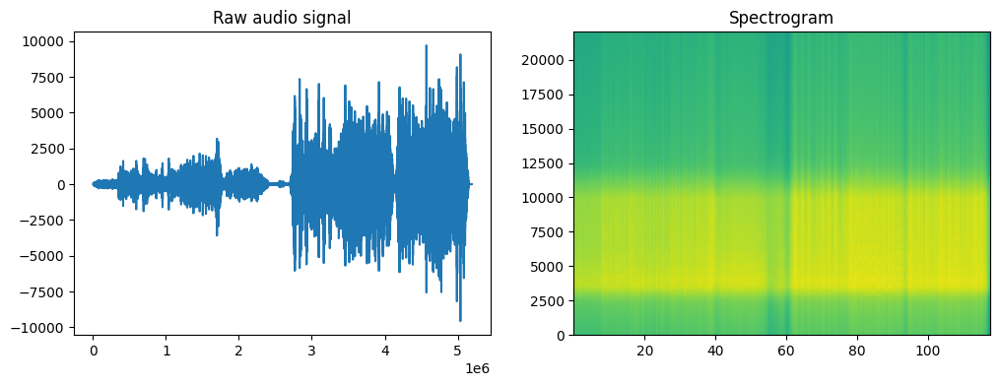

In [15]:
%matplotlib inline

lowcut=3500
highcut=10000

filteredBandPass = butter_bandpass_filter(aud, lowcut, highcut, rate, order=16)

from matplotlib import pyplot as plt
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
second = filteredBandPass[int(rate*0):int(rate*150)]
ax1.plot(second); ax1.set_title('Raw audio signal')
ax2.specgram(second, Fs=rate); ax2.set_title('Spectrogram')

## Play the result

In [23]:
import numpy as np
import IPython

IPython.display.Audio(filteredBandPass, rate=rate)